# IBM Capstone Project

## House Prices & Venues in London


### Project: Predicting London's House Prices with the Foursquare API

**Business Problem**: London is a significant metroplitan area. As we all know London has some of the highest property prices in the world, we also know that certain boroughs have significantly higher average property prices than other boroughs, think Kensington and Chelsea compared to Barnet. 

Therefore imagine you were looking to buy a property in London with know apriori knowledge of the area; the variation in costs, the type of restuarants in an area, closeness to the center, what borough would you select and why? - Is it a borough with a lot of venues (venue density), lower prices, or closer to the city center? This project seeks to develop a data driven solution to analyzing london's property prices by borough and venue density. 

**Task**: To see if we can accurately predict London's house prices by borough based on the amount of rated venues within a location.

**Method**: Using the Four Square API to mine location data, we segment venues and locations based on the London borough they reside in. We then use these segments to cluster the data based on the average value of a property for each borough. We then map this data to geographically to explore the variation in house prices in respect to venue density.

Based on definition of our problem, factors that will influence our decission are:
* number of existing venues (restuarants, gym, places on interest) in the neighborhood 
* number of and distance to the venues in the borough, if any
* distance of borough from the city center
* type of venues in the borough (price, rating etc...)


### Data Acquisition: 

1. Four Square API venue data. Loaded data in JSON format then converted it to a pandas df.


2. London's property prices data from the london data store: https://data.london.gov.uk/dataset/average-house-prices The dataset contained the **'year', 'average value', 'borough', 'measure'**, we also added the latitude and longitude values for each borough in order to carry out the analyses. 


3. Geospatial data from http://martinjc.github.io/UK-GeoJSON/json/eng/topo_eer.json in JSON format allowed us to conduct the geospatial analyses, specifically mapping the property prices to the clustered location data.



### Package Dependencies:

- pandas
- numpy
- bs4
- matplotlib
- json requests
- folium
- sklearn
- geopy

In [1]:
# Import Pandas to provide DataFrame support
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# Import BeautifulSoup
from bs4 import BeautifulSoup

import numpy as np # library to handle data in a vectorized manner

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


Let's load in the dataset. It will require a few stages of cleaning and wrangling to make it useful.

In [2]:
df3 = pd.read_csv('data/ldn-boroughs-house-prices-1.csv')
df3.head()

,ldn-boroughs-house-prices,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6
0,land-registry-house-prices-borough,NaN,NaN,NaN,NaN,NaN,NaN
1,Code,Area,Year,Measure,Value,Latitude,Longtitude
2,E09000001,City of London,Year ending Mar 2017,Mean,929037,51.511219,-0.085356585
3,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,51.528168,0.147455
4,E09000003,Barnet,Year ending Mar 2017,Mean,590823,51.576524,-0.24109133


## Data Cleaning:

In [3]:
# Check the dataset features:
df3.columns

Index(['ldn-boroughs-house-prices', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3',
       'Unnamed: 4', 'Unnamed: 5', 'Unnamed: 6'],
      dtype='object')

In [4]:
# Rename the columns
df3 = df3.rename(columns={"Unnamed: 1": "Borough",
                   "Unnamed: 2": "Year",
                   "Unnamed: 3": "Measure",
                   "Unnamed: 4": "AvgValue", 
                   "Unnamed: 5": "Latitude",
                   "Unnamed: 6": "Longitude" })

In [5]:
df3.columns

Index(['ldn-boroughs-house-prices', 'Borough', 'Year', 'Measure', 'AvgValue',
       'Latitude', 'Longitude'],
      dtype='object')

In [6]:
# Delete the rows with labels 0
df3 = df3.drop([0,1], axis=0)

In [7]:
df3.head()

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Latitude,Longitude
2,E09000001,City of London,Year ending Mar 2017,Mean,929037,51.511219,-0.085356585
3,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,51.528168,0.147455
4,E09000003,Barnet,Year ending Mar 2017,Mean,590823,51.576524,-0.24109133
5,E09000004,Bexley,Year ending Mar 2017,Mean,345354,51.464498,0.10883119
6,E09000005,Brent,Year ending Mar 2017,Mean,518109,51.540485,-0.29923989


In [8]:
df3.dtypes

ldn-boroughs-house-prices    object
Borough                      object
Year                         object
Measure                      object
AvgValue                     object
Latitude                     object
Longitude                    object
dtype: object

In [9]:
df3["Latitude"] = df3.Latitude.astype(float)

In [10]:
df3["Longitude"] = df3.Longitude.astype(float)

In [11]:
df3["AvgValue"] = df3.AvgValue.astype(int)

In [12]:
df3.dtypes

ldn-boroughs-house-prices     object
Borough                       object
Year                          object
Measure                       object
AvgValue                       int64
Latitude                     float64
Longitude                    float64
dtype: object

Depending on the later stages of the analysis we may need to drop some of the columns from this dataframe and append them with the main dataframe (df3).

#### Read in the dataframe:

In [10]:
df = pd.read_csv('data/ldn-boroughs-house-prices.csv')
df.head()

,land-registry-house-prices-borough,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6
0,Code,Area,Year,Measure,Value,Latitude,Longtitude
1,E09000001,City of London,Year ending Mar 2017,Mean,"929,037",51.511219,-0.085356585
2,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,"299,383",51.528168,0.147455
3,E09000003,Barnet,Year ending Mar 2017,Mean,"590,823",51.576524,-0.24109133
4,E09000004,Bexley,Year ending Mar 2017,Mean,"345,354",51.464498,0.10883119


In [11]:
df2 = df.rename(columns={"Unnamed: 1": "Borough",
                   "Unnamed: 2": "Year",
                   "Unnamed: 3": "Measure",
                   "Unnamed: 4": "Value", 
                   "Unnamed: 5": "Latitude",
                   "Unnamed: 6": "Longitude" })

In [12]:
# Delete the rows with labels 0
df3 = df2.drop([0], axis=0)

In [13]:
#import pandas as pd
#df1 = pd.read_json (r'data/coordinates.json')
#df1.to_csv (r'data/coordinates.csv', index = None)
#df1.head(10)

In [14]:
df3.head()

,land-registry-house-prices-borough,Borough,Year,Measure,Value,Latitude,Longitude
1,E09000001,City of London,Year ending Mar 2017,Mean,"929,037",51.511219,-0.085356585
2,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,"299,383",51.528168,0.147455
3,E09000003,Barnet,Year ending Mar 2017,Mean,"590,823",51.576524,-0.24109133
4,E09000004,Bexley,Year ending Mar 2017,Mean,"345,354",51.464498,0.10883119
5,E09000005,Brent,Year ending Mar 2017,Mean,"518,109",51.540485,-0.29923989


In [15]:
df3.dtypes

land-registry-house-prices-borough    object
Borough                               object
Year                                  object
Measure                               object
Value                                 object
Latitude                              object
Longitude                             object
dtype: object

In [16]:
df3["Latitude"] = df3.Latitude.astype(float)

In [17]:
df3["Longitude"] = df3.Longitude.astype(float)

In [18]:
df3.dtypes

land-registry-house-prices-borough     object
Borough                                object
Year                                   object
Measure                                object
Value                                  object
Latitude                              float64
Longitude                             float64
dtype: object

## EDA:

In [23]:
from pandas_profiling import ProfileReport

/Users/joseph_arber/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [26]:
prof = ProfileReport(df)
prof.to_file(output_file='output.html')

In [27]:
prof

## Foursquare API

In [21]:
address = 'London, London'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


/Users/joseph_arber/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.22.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  This is separate from the ipykernel package so we can avoid doing imports until


In [22]:
df3.head()

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Latitude,Longitude
2,E09000001,City of London,Year ending Mar 2017,Mean,929037,51.511219,-0.085357
3,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,51.528168,0.147455
4,E09000003,Barnet,Year ending Mar 2017,Mean,590823,51.576524,-0.241091
5,E09000004,Bexley,Year ending Mar 2017,Mean,345354,51.464498,0.108831
6,E09000005,Brent,Year ending Mar 2017,Mean,518109,51.540485,-0.299240


In [23]:
import math

Let's set a map which marks london's boroughs

In [24]:
map_London = folium.Map(location=[latitude, longitude], zoom_start=9.5)

In [25]:
# add markers to map
for lat, lng, borough in zip(df3['Latitude'], df3['Longitude'], df3['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_London)  
    
map_London

Pass through Foursquare credentials

In [26]:
# Set up Foursquare
CLIENT_ID = 'K2D5QVKQ0QPUPIKECQU2JIB3CHVFT4ZMTJQC5WVTRNYTDD5Z'
CLIENT_SECRET = '5ZVFLDC04W0W5SHCBZ11MDRG0MELPIER3QIFUOAWFAIZKJNK'
VERSION = '20200808' # Foursquare API version
LIMIT = 300
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: K2D5QVKQ0QPUPIKECQU2JIB3CHVFT4ZMTJQC5WVTRNYTDD5Z
CLIENT_SECRET:5ZVFLDC04W0W5SHCBZ11MDRG0MELPIER3QIFUOAWFAIZKJNK


Set the latitude and longitude data for London

In [27]:
london_data = df3

borough_latitude = london_data.loc[2, 'Latitude'] # neighborhood latitude value
borough_longitude = london_data.loc[2, 'Longitude'] # neighborhood longitude value

borough_name = london_data.loc[2, 'Borough'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(borough_name, 
                                                               borough_latitude, 
                                                               borough_longitude))

Latitude and longitude values of City of London are 51.511219, -0.085356585.


In [28]:
LIMIT = 100
radius = 750
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    borough_latitude, 
    borough_longitude, 
    radius, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?&client_id=K2D5QVKQ0QPUPIKECQU2JIB3CHVFT4ZMTJQC5WVTRNYTDD5Z&client_secret=5ZVFLDC04W0W5SHCBZ11MDRG0MELPIER3QIFUOAWFAIZKJNK&v=20200808&ll=51.511219,-0.085356585&radius=750&limit=100'

#### Get the venue data

We will scrape the data in json format. After which we will then filter this data into relevant categories.

In [29]:
results = requests.get(url).json()

In [30]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [31]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

/Users/joseph_arber/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  This is separate from the ipykernel package so we can avoid doing imports until


,name,categories,lat,lng
0,Sky Garden,Scenic Lookout,51.511168,-0.083625
1,Cyclebeat,Gym / Fitness Center,51.511686,-0.086461
2,St Dunstan in the East Garden,Garden,51.509716,-0.082354
3,Thames Path,Trail,51.508810,-0.086496
4,Curators Coffee Studio,Coffee Shop,51.512085,-0.082568


In [32]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


#### Segment data

The scraped venue data will then be appended to the location of each borough. We have to make another api request to do this.

In [33]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Borough', 
                  'Borough Latitude', 
                  'Borough Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Take a look at the boroughs in the data frame.

In [34]:
london_venues = getNearbyVenues(names=london_data['Borough'],
                                   latitudes=london_data['Latitude'],
                                   longitudes=london_data['Longitude']
                                  )

City of London
Barking and Dagenham
Barnet
Bexley
Brent
Bromley
Camden
Croydon
Ealing
Enfield
Greenwich
Hackney
Hammersmith and Fulham
Haringey
Harrow
Havering
Hillingdon
Hounslow
Islington
Kensington and Chelsea
Kingston upon Thames
Lambeth
Lewisham
Merton
Newham
Redbridge
Richmond upon Thames
Southwark
Sutton
Tower Hamlets
Waltham Forest
Wandsworth
Westminster


In [27]:
print(london_venues.shape)
london_venues.head()

(789, 7)


,Borough,Borough Latitude,Borough Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,City of London,51.511219,-0.085357,Sky Garden,51.511168,-0.083625,Scenic Lookout
1,City of London,51.511219,-0.085357,Cyclebeat,51.511686,-0.086461,Gym / Fitness Center
2,City of London,51.511219,-0.085357,Curators Coffee Studio,51.512085,-0.082568,Coffee Shop
3,City of London,51.511219,-0.085357,St Dunstan in the East Garden,51.509716,-0.082354,Garden
4,City of London,51.511219,-0.085357,Thames Path,51.508810,-0.086496,Trail


In [35]:
summary = london_venues.groupby('Borough').count().reset_index()
summary['Count'] = summary['Venue']
summary = summary.drop(['Borough Latitude', 'Borough Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude','Venue Category'], axis=1)
summary = summary.sort_values('Count').reset_index(drop=True)
summary.head(15)

,Borough,Count
0,Hillingdon,4
1,Newham,4
2,Lewisham,4
3,Havering,5
4,Enfield,5
5,Ealing,5
6,Redbridge,6
7,Merton,6
8,Hounslow,6
9,Barking and Dagenham,6


## Analysis

#### What part of London has the most venues?

In [36]:
import matplotlib.pyplot as plt; plt.rcdefaults()
import numpy as np
import matplotlib.pyplot as plt
 
fg, ax = plt.subplots(dpi = 300)    
    
objects = summary.Borough
y_pos = np.arange(len(objects))
performance = summary.Count

plt.bar(y_pos, performance, align='center', alpha=0.4)
plt.xticks(y_pos, objects)
plt.ylabel('Venue')
plt.title('Total Number of Venue in Borough')
plt.xticks(rotation=90)

plt.show()

<Figure size 1920x1440 with 1 Axes>

In [37]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 188 uniques categories.


**'One hot encode'** the values. One hot encoding is a process by which categorical variables are converted into a form that could be provided to ML algorithms to do a better job in prediction.

In [38]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Borough'] = london_venues['Borough'] 

# move neighborhood column to the first column
list_column = london_onehot.columns.tolist()
number_column = int(list_column.index('Borough'))
list_column = [list_column[number_column]] + list_column[:number_column] + list_column[number_column+1:] 
london_onehot = london_onehot[list_column]

london_onehot.head()

,Borough,American Restaurant,Antique Shop,Aquarium,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Auto Garage,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bar,Beer Bar,Beer Garden,Beer Store,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Building,Burger Joint,Bus Station,Bus Stop,Butcher,Café,Camera Store,Canal,Canal Lock,Caribbean Restaurant,Champagne Bar,Chinese Restaurant,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Convenience Store,Cosmetics Shop,Costume Shop,Cupcake Shop,Currywurst Joint,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Donut Shop,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Historic Site,History Museum,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Theater,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Liquor Store,Lounge,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Modern European Restaurant,Movie Theater,Moving Target,Museum,Music Store,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Organic Grocery,Pakistani Restaurant,Park,Performing Arts Venue,Persian Restaurant,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Portuguese Restaurant,Pub,Ramen Restaurant,Recording Studio,Reservoir,Restaurant,Roof Deck,Salad Place,Salsa Club,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Plaza,Skate Park,Soccer Field,Soup Place,South American Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sri Lankan Restaurant,Steakhouse,Street Art,Street Food Gathering,Supermarket,Sushi Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theater,Theme Park Ride / Attraction,Thrift / Vintage Store,Trail,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Veneto Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Yoga Studio
0,City of London,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,City of London,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,City of London,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,City of London,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,

In [39]:
london_grouped = london_onehot.groupby('Borough').mean().reset_index()
london_grouped.head()

,Borough,American Restaurant,Antique Shop,Aquarium,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Auto Garage,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bar,Beer Bar,Beer Garden,Beer Store,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Building,Burger Joint,Bus Station,Bus Stop,Butcher,Café,Camera Store,Canal,Canal Lock,Caribbean Restaurant,Champagne Bar,Chinese Restaurant,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Convenience Store,Cosmetics Shop,Costume Shop,Cupcake Shop,Currywurst Joint,Dance Studio,Deli / Bodega,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Donut Shop,Electronics Store,English Restaurant,Ethiopian Restaurant,Event Space,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Historic Site,History Museum,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Theater,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Kebab Restaurant,Korean Restaurant,Latin American Restaurant,Liquor Store,Lounge,Market,Massage Studio,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Modern European Restaurant,Movie Theater,Moving Target,Museum,Music Store,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Organic Grocery,Pakistani Restaurant,Park,Performing Arts Venue,Persian Restaurant,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Portuguese Restaurant,Pub,Ramen Restaurant,Recording Studio,Reservoir,Restaurant,Roof Deck,Salad Place,Salsa Club,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Plaza,Skate Park,Soccer Field,Soup Place,South American Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sri Lankan Restaurant,Steakhouse,Street Art,Street Food Gathering,Supermarket,Sushi Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theater,Theme Park Ride / Attraction,Thrift / Vintage Store,Trail,Train Station,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Veneto Restaurant,Video Game Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Yoga Studio
0,Barking and Dagenham,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.000000,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0
1,Barnet,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.

#### What are the most common types of venue?

In [40]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [41]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Borough']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
boroughs_venues_sorted = pd.DataFrame(columns=columns)
boroughs_venues_sorted['Borough'] = london_grouped['Borough']

for ind in np.arange(london_grouped.shape[0]):
    boroughs_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_grouped.iloc[ind, :], num_top_venues)

boroughs_venues_sorted.head(15)

,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Barking and Dagenham,Hotel,Warehouse Store,Food & Drink Shop,Pub,Supermarket,Fast Food Restaurant,Farmers Market,Food Court,Food,Flower Shop
1,Barnet,Bus Stop,Platform,Train Station,Fried Chicken Joint,Gas Station,Reservoir,Kebab Restaurant,Indian Restaurant,Costume Shop,Diner
2,Bexley,Coffee Shop,Supermarket,Pub,Grocery Store,Fast Food Restaurant,Pizza Place,Fish & Chips Shop,Pharmacy,Café,Restaurant
3,Brent,Indian Restaurant,Supermarket,Bridal Shop,Bus Stop,Café,Asian Restaurant,Gym / Fitness Center,Sandwich Place,Film Studio,Food Court
4,Bromley,Café,Tunnel,Pub,Hardware Store,Platform,Playground,Music Store,Convenience Store,Train Station,Trail
5,Camden,Coffee Shop,Italian Restaurant,Greek Restaurant,Hotel,Cocktail Bar,Café,Sushi Restaurant,Gym / Fitness Center,French Restaurant,Organic Grocery
6,City of London,Hotel,Gym / Fitness Center,Sandwich Place,Coffee Shop,Garden,French Restaurant,Italian Restaurant,Restaurant,Pub,Champagne Bar
7,Croydon,Pub,Football Stadium,Platform,Café,Train Station,Event Space,Food & Drink Shop,Food,Flower Shop,Flea Market
8,Ealing,Park,Indian Restaurant,Supermarket,Train Station,Grocery Store,Event Space,Food & Drink Shop,Food,Flower Shop,Flea Market
9,Enfield,Warehouse Store,Furniture / Home Store,Clothing Store,Grocery Store,Fast Food Restaurant,Yoga Studio,Event Space,Food & Drink Shop,Food,Flower Shop


In [42]:
boroughs_venues_sorted.tail()

,Borough,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
28,Sutton,Pub,Park,Spa,Italian Restaurant,Historic Site,Coffee Shop,Café,Soccer Field,Bar,Platform
29,Tower Hamlets,Gym / Fitness Center,Indian Restaurant,Plaza,Park,Breakfast Spot,Street Food Gathering,Supermarket,Pub,Beer Garden,Convenience Store
30,Waltham Forest,Coffee Shop,Nature Preserve,Café,Convenience Store,Italian Restaurant,Grocery Store,Bakery,Sandwich Place,Yoga Studio,Fast Food Restaurant
31,Wandsworth,Pub,Bus Stop,Café,Thai Restaurant,Bakery,Japanese Restaurant,Deli / Bodega,Garden Center,Coffee Shop,Moving Target
32,Westminster,Pub,Theater,Restaurant,Coffee Shop,Bookstore,Dessert Shop,Bar,Historic Site,Steakhouse,Cocktail Bar


## K-means Clustering

In [43]:
# set number of clusters
kclusters = 10

london_grouped_clustering = london_grouped.drop('Borough', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
labels = kmeans.labels_
labels

array([5, 0, 0, 0, 0, 0, 0, 7, 4, 8, 0, 0, 0, 0, 0, 4, 9, 0, 0, 0, 0, 0,
       2, 6, 1, 0, 0, 3, 0, 0, 0, 0, 0], dtype=int32)

Check to see the optimum K.

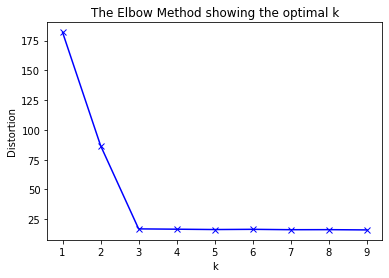

In [44]:
from scipy.spatial.distance import cdist

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(london_grouped_clustering)
    #kmeanModel.fit(istanbul_grouped_clustering)
    distortions.append(sum(np.min(cdist(london_grouped_clustering, kmeanModel.cluster_centers_, 'canberra'), axis=1)) / london_grouped_clustering.shape[0])

#There are different metric distance function for spatial distance. 
#I choose correlation instaed of euclidean because the canberra function gives me more clear view of elbow break point.

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

We need to create a new dataframe that includes the top 10 venues and the cluster for each neighborhood.

In [45]:
london_merged = london_data

# add clustering labels
london_merged['Cluster Labels'] = kmeans.labels_

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
london_merged = london_merged.join(boroughs_venues_sorted.set_index('Borough'), on='Borough')

london_merged.head(10) # check the last columns!

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,E09000001,City of London,Year ending Mar 2017,Mean,929037,51.511219,-0.085357,5,Hotel,Gym / Fitness Center,Sandwich Place,Coffee Shop,Garden,French Restaurant,Italian Restaurant,Restaurant,Pub,Champagne Bar
3,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,51.528168,0.147455,0,Hotel,Warehouse Store,Food & Drink Shop,Pub,Supermarket,Fast Food Restaurant,Farmers Market,Food Court,Food,Flower Shop
4,E09000003,Barnet,Year ending Mar 2017,Mean,590823,51.576524,-0.241091,0,Bus Stop,Platform,Train Station,Fried Chicken Joint,Gas Station,Reservoir,Kebab Restaurant,Indian Restaurant,Costume Shop,Diner
5,E09000004,Bexley,Year ending Mar 2017,Mean,345354,51.464498,0.108831,0,Coffee Shop,Supermarket,Pub,Grocery Store,Fast Food Restaurant,Pizza Place,Fish & Chips Shop,Pharmacy,Café,Restaurant
6,E09000005,Brent,Year ending Mar 2017,Mean,518109,51.540485,-0.299240,0,Indian Restaurant,Supermarket,Bridal Shop,Bus Stop,Café,Asian Restaurant,Gym / Fitness Center,Sandwich Place,Film Studio,Food Court
7,E09000006,Bromley,Year ending Mar 2017,Mean,483847,51.418116,-0.060054,0,Café,Tunnel,Pub,Hardware Store,Platform,Playground,Music Store,Convenience Store,Train Station,Trail
8,E09000007,Camden,Year ending Mar 2017,Mean,1029438,51.521110,-0.136632,0,Coffee Shop,Italian Restaurant,Greek Restaurant,Hotel,Cocktail Bar,Café,Sushi Restaurant,Gym / Fitness Center,French Restaurant,Organic Grocery
9,E09000008,Croydon,Year ending Mar 2017,Mean,377366,51.391507,-0.088001,7,Pub,Football Stadium,Platform,Café,Train Station,Event Space,Food & Drink Shop,Food,Flower Shop,Flea Market
10,E09000009,Ealing,Year ending Mar 2017,Mean,552560,51.557029,-0.362268,4,Park,Indian Restaurant,Supermarket,Train Station,Grocery Store,Event Space,Food & Drink Shop,Food,Flower Shop,Flea Market
11,E09000010,Enfield,Year ending Mar 2017,Mean,459261,51.655986,-0.030771,8,Warehouse Store,Furniture / Home Store,Clothing Store,Grocery Store,Fast Food Restaurant,Yoga Studio,Event Space,Food & Drink Shop,Food,Flower Shop


#### What is the most common venue in each cluster?

In [46]:
count_venue = london_merged
count_venue = count_venue.drop(['Borough','AvgValue', 'Latitude', 'Longitude'], axis=1)
count_venue = count_venue.groupby(['Cluster Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster = count_venue.pivot(index='Cluster Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster = cv_cluster.fillna(0).astype(int).reset_index(drop=True)
cv_cluster

1st Most Common Venue,Brewery,Bus Station,Bus Stop,Café,Clothing Store,Coffee Shop,Furniture / Home Store,Golf Course,Grocery Store,Gym / Fitness Center,Hotel,Indian Restaurant,Market,Metro Station,Park,Pool,Pub,Train Station,Warehouse Store
0,0,1,1,3,1,3,1,1,0,2,2,1,0,0,0,0,6,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


Create a bar chart that shows the proper labels of each cluster.

Text(0, 0.5, 'Clusters')

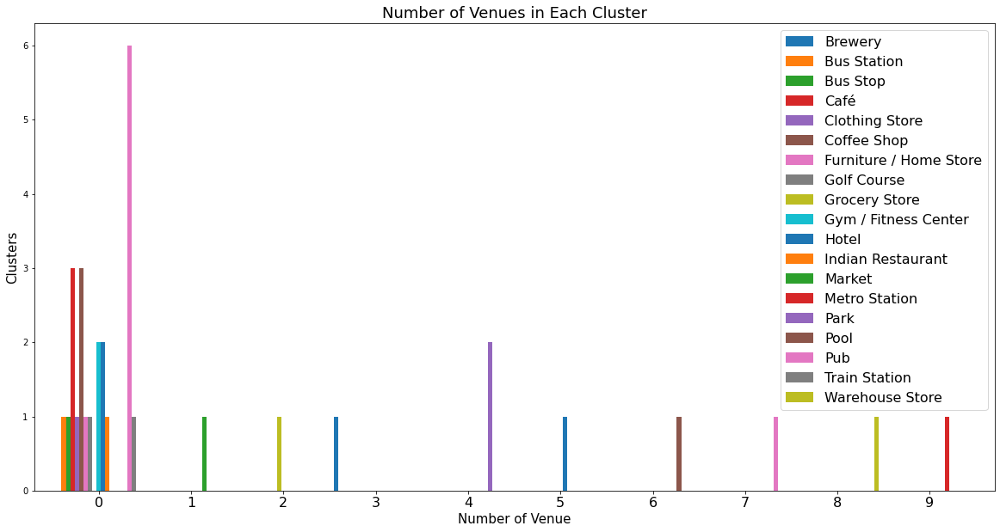

In [47]:
#creating a bar chart of "Number of Venues in Each Cluster"
frame=cv_cluster.plot(kind='bar',figsize=(20,10),width = 0.9)


plt.legend(labels=cv_cluster.columns,fontsize= 16)
plt.title("Number of Venues in Each Cluster",fontsize= 18)
plt.xticks(fontsize=16)
plt.xticks(rotation=0)
plt.xlabel('Number of Venue', fontsize=15)
plt.ylabel('Clusters', fontsize=15)

In [48]:
Cluster_labels = {'Clusters': [0,1,2], 'Labels': ["Cafe Venues","Multiple Social Venues","Accommodation & Intensive Cafe Venues"]}
Cluster_labels = pd.DataFrame(data=Cluster_labels)
Cluster_labels

,Clusters,Labels
0,0,Cafe Venues
1,1,Multiple Social Venues
2,2,Accommodation & Intensive Cafe Venues


In [49]:
df3.head()

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Latitude,Longitude,Cluster Labels
2,E09000001,City of London,Year ending Mar 2017,Mean,929037,51.511219,-0.085357,5
3,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,51.528168,0.147455,0
4,E09000003,Barnet,Year ending Mar 2017,Mean,590823,51.576524,-0.241091,0
5,E09000004,Bexley,Year ending Mar 2017,Mean,345354,51.464498,0.108831,0
6,E09000005,Brent,Year ending Mar 2017,Mean,518109,51.540485,-0.299240,0


In [50]:
data_process = df3.sort_values('AvgValue').reset_index(drop=True)
data_process = data_process.drop(['Latitude', 'Longitude'], axis=1)
data_process.head(10)

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Cluster Labels
0,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,0
1,E09000004,Bexley,Year ending Mar 2017,Mean,345354,0
2,E09000016,Havering,Year ending Mar 2017,Mean,366822,4
3,E09000008,Croydon,Year ending Mar 2017,Mean,377366,7
4,E09000025,Newham,Year ending Mar 2017,Mean,385116,1
5,E09000029,Sutton,Year ending Mar 2017,Mean,391484,0
6,E09000026,Redbridge,Year ending Mar 2017,Mean,429587,0
7,E09000031,Waltham Forest,Year ending Mar 2017,Mean,440634,0
8,E09000023,Lewisham,Year ending Mar 2017,Mean,441406,2
9,E09000017,Hillingdon,Year ending Mar 2017,Mean,444236,9


#### What are the most expensive boroughs in London to buy a house?

In [51]:
df3['AvgValue'].max()

1984323

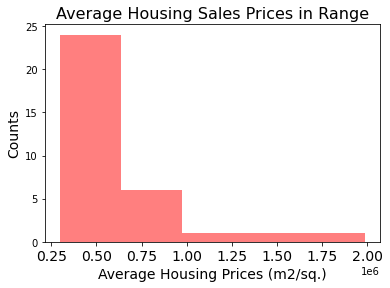

In [52]:
num_bins = 5
n, bins, patches = plt.hist(data_process['AvgValue'], num_bins, facecolor='red', alpha=0.5)
plt.title("Average Housing Sales Prices in Range",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Average Housing Prices (m2/sq.)', fontsize=14)
plt.ylabel('Counts', fontsize=14)
plt.show()


The average value of a property in London is around £600000. This means we can segment around this value. 

In [53]:
df3['AvgValue'].mean()

634186.9696969697

In [102]:
level = []
for i in range(0,len(data_process)):
    if (data_process['AvgValue'][i] < 300000):
        level.append("Low Level HSP")
    elif (data_process['AvgValue'][i] >= 300000 and data_process['AvgValue'][i] < 450000):
        level.append("Mid-1 Level HSP")
    elif (data_process['AvgValue'][i] >= 450000 and data_process['AvgValue'][i] < 750000):
        level.append("Mid-2 Level HSP")
    elif (data_process['AvgValue'][i] >= 750000 and data_process['AvgValue'][i] < 1000000):
        level.append("High-1 Level HSP")
    else:
        level.append("High-2 Level HSP")   

data_process['Level_labels'] = level
data_process.head(35)

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Cluster Labels,Level_labels
0,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,0,Low Level HSP
1,E09000004,Bexley,Year ending Mar 2017,Mean,345354,0,Mid-1 Level HSP
2,E09000016,Havering,Year ending Mar 2017,Mean,366822,4,Mid-1 Level HSP
3,E09000008,Croydon,Year ending Mar 2017,Mean,377366,7,Mid-1 Level HSP
4,E09000025,Newham,Year ending Mar 2017,Mean,385116,1,Mid-1 Level HSP
5,E09000029,Sutton,Year ending Mar 2017,Mean,391484,0,Mid-1 Level HSP
6,E09000026,Redbridge,Year ending Mar 2017,Mean,429587,0,Mid-1 Level HSP
7,E09000031,Waltham Forest,Year ending Mar 2017,Mean,440634,0,Mid-1 Level HSP
8,E09000023,Lewisham,Year ending Mar 2017,Mean,441406,2,Mid-1 Level HSP
9,E09000017,Hillingdon,Year ending Mar 2017,Mean,444236,9,Mid-1 Level HSP


#### Results:

High-2 Level HSP:
- Kensington and Chelsea
- Westminster
- Camden

High-1 Level HSP:
- Hammersmith and Fulham
- City of London

Mid-1 Level HSP:
- Majority of the other boroughs
 
Low Level HSP:
- Bakring and Dagenham

In [103]:
top3 = london_venues.groupby(['Borough','Venue Category']).size().reset_index(name='Counts')
top3 = top3.sort_values(['Borough','Counts'],ascending=False).groupby('Borough').head(3).reset_index(drop=True)

top3['Join'] = top3['Counts'].map(str) + " " + top3['Venue Category']
top3 = top3.groupby(['Borough'])['Join'].apply(", ".join).reset_index()

top3.head(10)

,Borough,Join
0,Barking and Dagenham,"1 Fast Food Restaurant, 1 Food & Drink Shop, 1..."
1,Barnet,"2 Bus Stop, 1 Costume Shop, 1 Fried Chicken Joint"
2,Bexley,"4 Coffee Shop, 3 Supermarket, 2 Fast Food Rest..."
3,Brent,"2 Indian Restaurant, 2 Supermarket, 1 Asian Re..."
4,Bromley,"2 Café, 1 Coffee Shop, 1 Convenience Store"
5,Camden,"10 Coffee Shop, 4 Italian Restaurant, 3 Café"
6,City of London,"4 Hotel, 3 Coffee Shop, 3 Gym / Fitness Center"
7,Croydon,"2 Pub, 1 Café, 1 Football Stadium"
8,Ealing,"1 Grocery Store, 1 Indian Restaurant, 1 Park"
9,Enfield,"1 Clothing Store, 1 Fast Food Restaurant, 1 Fu..."


In [104]:
result = pd.merge(london_merged, 
                    top3[['Borough', 'Join']],
                    left_on = 'Borough',
                    right_on = 'Borough',
                    how = 'left')
result= pd.merge(result, 
                    Cluster_labels[['Clusters', 'Labels']],
                    left_on = 'Cluster Labels',
                    right_on = 'Clusters',
                    how = 'left')
result = pd.merge(result, 
                    data_process[['Borough', 'Level_labels']],
                    left_on = 'Borough',
                    right_on = 'Borough',
                    how = 'left')

result = result.drop(['Clusters'], axis=1)
result.head(5)

,ldn-boroughs-house-prices,Borough,Year,Measure,AvgValue,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Join,Labels,Level_labels
0,E09000001,City of London,Year ending Mar 2017,Mean,929037,51.511219,-0.085357,5,Hotel,Gym / Fitness Center,Sandwich Place,Coffee Shop,Garden,French Restaurant,Italian Restaurant,Restaurant,Pub,Champagne Bar,"4 Hotel, 3 Coffee Shop, 3 Gym / Fitness Center",NaN,High-1 Level HSP
1,E09000002,Barking and Dagenham,Year ending Mar 2017,Mean,299383,51.528168,0.147455,0,Hotel,Warehouse Store,Food & Drink Shop,Pub,Supermarket,Fast Food Restaurant,Farmers Market,Food Court,Food,Flower Shop,"1 Fast Food Restaurant, 1 Food & Drink Shop, 1...",Cafe Venues,Low Level HSP
2,E09000003,Barnet,Year ending Mar 2017,Mean,590823,51.576524,-0.241091,0,Bus Stop,Platform,Train Station,Fried Chicken Joint,Gas Station,Reservoir,Kebab Restaurant,Indian Restaurant,Costume Shop,Diner,"2 Bus Stop, 1 Costume Shop, 1 Fried Chicken Joint",Cafe Venues,Mid-2 Level HSP
3,E09000004,Bexley,Year ending Mar 2017,Mean,345354,51.464498,0.108831,0,Coffee Shop,Supermarket,Pub,Grocery Store,Fast Food Restaurant,Pizza Place,Fish & Chips Shop,Pharmacy,Café,Restaurant,"4 Coffee Shop, 3 Supermarket, 2 Fast Food Rest...",Cafe Venues,Mid-1 Level HSP
4,E09000005,Brent,Year ending Mar 2017,Mean,518109,51.540485,-0.299240,0,Indian Restaurant,Supermarket,Bridal Shop,Bus Stop,Café,Asian Restaurant,Gym / Fitness Center,Sandwich Place,Film Studio,Food Court,"2 Indian Restaurant, 2 Supermarket, 1 Asian Re...",Cafe Venues,Mid-2 Level HSP


In [105]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=9.5)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster, join, cluster_number, label in zip(result['Latitude'], result['Longitude'], result['Borough'], result['Labels'], result['Join'], result['Cluster Labels'], result['Level_labels']):
    label = folium.Popup(str(poi) + " / " + str(cluster) + "-" + str(label) + " / " + str(join), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        color= rainbow[cluster_number-1],
        popup=label,
        fill_color = rainbow[cluster_number-1],
        fill_opacity=1).add_to(map_clusters)
       
map_clusters

## Geospatial JSON

We explore 3 sources of geospatial data.

1. London Government data: https://data.london.gov.uk/download/excel-mapping-template-for-london-boroughs-and-wards


2. London Assembly Constituencies (December 2018) Names and Codes in England from the **ArcGIS Hub:** https://opendata.arcgis.com/datasets/1f260fe888814f548dec5c0f2a68895b


3. GeoJSON versions of UK boundary data downloaded from GitHub, which is used for creating choropleth maps of UK areas: https://github.com/martinjc/UK-GeoJSON


4. GeoJSON data of the Administrative Divisions of London from **Spatial Data Repository of NYU** [2]: https://geo.nyu.edu/catalog/stanford-tw109mk0781



The first one is an excel file, however it has far too many columns and only provides one value for the geospatial coordinates of each borough (see below). The next file are JSON files extracted from various web sources. Source number 4 was used for the final analysis as it was the most easy to clean. Geo.json file 4 has coordinates of the all city of London. I cleaned the data and reduced it to city of London where I used it to create choropleth map of Housing Sales Price Index of London.

In [77]:
url = 'https://data.london.gov.uk/download/excel-mapping-template-for-london-boroughs-and-wards/58f59b22-946e-43e9-96fd-c0a4fa27f76a/Mapping-template-for-London-boroughs.xls'
df4 = pd.read_excel(url)
df4.head()

,Old Code,New Code,Boroughs,Values,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,"To use different colours to the default ones, find the RGB values of the colours you want, and enter them into the cell grid starting in T22.",Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,UpdateAllcells,Unnamed: 22,Unnamed: 23,MapNameToShape,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40,Unnamed: 41,Unnamed: 42,Unnamed: 43,Unnamed: 44
0,00AA,E09000001,City of London,43.209877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Note: The map will only update when the data i...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R1C4,NaN,NaN,CityofLondon,Freeform 1674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00AB,E09000002,Barking and Dagenham,32.035054,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Barking,Freeform 1675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,00AC,E09000003,Barnet,19.277721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The low/high threshold ranges will be rounded ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Barnet,Freeform 1695,NaN,NaN,NaN,NaN,Threshhold values,Colour (RGB),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,00AD,E09000004,Bexley,9.071730,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bexley,Freeform 1683,NaN,NaN,NaN,NaN,43.2963,16777215,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,00AE,E09000005,Brent,16.947594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Brent,Freeform 1696,NaN,NaN,NaN,NaN,NaN,7225856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
df4 = df4[['Boroughs', 'Values']]
df4.head()

,Boroughs,Values
0,City of London,43.209877
1,Barking and Dagenham,32.035054
2,Barnet,19.277721
3,Bexley,9.071730
4,Brent,16.947594


In [108]:
import requests
import json
response_1  = json.loads(requests.get("https://opendata.arcgis.com/datasets/1f260fe888814f548dec5c0f2a68895b_0.geojson").text)

In [109]:
response_1

{'type': 'FeatureCollection',
 'name': 'London_Assembly_Constituencies__December_2018__Names_and_Codes_in_England',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'LAC18CD': 'E32000001',
    'LAC18NM': 'Barnet and Camden',
    'FID': 1},
   'geometry': None},
  {'type': 'Feature',
   'properties': {'LAC18CD': 'E32000002',
    'LAC18NM': 'Bexley and Bromley',
    'FID': 2},
   'geometry': None},
  {'type': 'Feature',
   'properties': {'LAC18CD': 'E32000003',
    'LAC18NM': 'Brent and Harrow',
    'FID': 3},
   'geometry': None},
  {'type': 'Feature',
   'properties': {'LAC18CD': 'E32000004',
    'LAC18NM': 'City and East',
    'FID': 4},
   'geometry': None},
  {'type': 'Feature',
   'properties': {'LAC18CD': 'E32000005',
    'LAC18NM': 'Croydon and Sutton',
    'FID': 5},
   'geometry': None},
  {'type': 'Feature',
   'properties': {'LAC18CD': 'E32000006',
    'LAC18NM': 'Ealing and Hillingdon',
 

In [92]:
import requests
import json
response = json.loads(requests.get("https://raw.githubusercontent.com/martinjc/UK-GeoJSON/master/json/administrative/eng/lad.json").text)

In [93]:
response

{'type': 'FeatureCollection',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'LAD13CD': 'E06000001',
    'LAD13CDO': '00EB',
    'LAD13NM': 'Hartlepool',
    'LAD13NMW': None},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-1.241956526315958, 54.722452909315834],
       [-1.242505189342398, 54.72242038994674],
       [-1.24192061729046, 54.722713302903806],
       [-1.241956526315958, 54.722452909315834]]],
     [[[-1.270237428346303, 54.7271584144655],
       [-1.268210325997062, 54.72608036652354],
       [-1.267390512992676, 54.726854573664205],
       [-1.265882373803238, 54.72662078504825],
       [-1.264695411850965, 54.725971937199624],
       [-1.263208539118907, 54.72645179669318],
       [-1.260565163468531, 54.72571946195082],
       [-1.258546933685663, 54.72604504550064],
       [-1.25882250176557, 54.72540866604163],
       [-1.257430512310725, 54.72553675154943],
  

Let's take another look at the property price range labels to remind ourselves of what segmentations we can expect.

In [ ]:
data_process

In [116]:
import json

with open('data/stanford-tw109mk0781-geojson.json') as f:
  response_3 = json.load(f)

Take a look at the json data.

In [117]:
response_3

{'type': 'FeatureCollection',
 'totalFeatures': 1,
 'features': [{'type': 'Feature',
   'id': 'tw109mk0781.1',
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-0.00895721, 51.99339193],
       [-0.00808632, 51.99333903],
       [-0.00408007, 51.99336739],
       [-0.00365996, 51.99334192],
       [-0.00327266, 51.99327807],
       [-0.00294707, 51.99314124],
       [-0.00238979, 51.992565],
       [-0.00183071, 51.99214701],
       [-0.00156373, 51.99189612],
       [-0.0013763, 51.9915782],
       [-0.00128022, 51.99125055],
       [-0.00119727, 51.99054454],
       [-0.0011852, 51.99014818],
       [-0.00126276, 51.98935845],
       [-0.00125378, 51.98806084],
       [-0.00121256, 51.98715864],
       [-0.00114159, 51.9867222],
       [-0.0010182, 51.98633564],
       [-0.00086201, 51.98600072],
       [-0.0006904, 51.98572961],
       [-0.00010348, 51.984848],
       [0.00035657, 51.98437213],
       [0.00062325, 51.98416559],
       [0.00091239, 51.98399999],
       

In [118]:
london_geo = response_3

#Lonson La, Lo
latitude = 51.5074
longitude = 0.1278

# display London
london_map = folium.Map(location=[latitude, longitude], zoom_start=10)

In [119]:
london_map

In [122]:
london_map.choropleth(
    geo_data=london_geo,
    data=data_process,
    columns=['Borough','AvgValue'],
    key_on='feature.coordinates',
    fill_color='PRGn', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='House Sales Price in London',
    highlight=True
)

markers_colors = []
for lat, lon, poi, cluster, join, cluster_number, label in zip(result['Latitude'], result['Longitude'], result['Borough'], result['Labels'], result['Join'], result['Cluster Labels'], result['Level_labels']):
    label = folium.Popup(str(poi) + " / " + str(cluster) + "-" + str(label) + " / " + str(join), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=7,
        popup=label,
        color= rainbow[cluster_number-1],
        fill=True,
        fill_color= rainbow[cluster_number-1],
        fill_opacity=1).add_to(london_map)
   


london_map